In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gunet_t/pytorch/default/1/gunet_t.pth
/kaggle/input/haze4k-t/Haze4K-T/GT/2664.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2539.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1231.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1017.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2437.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2015.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2300.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2673.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2823.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1522.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2064.png
/kaggle/input/haze4k-t/Haze4K-T/GT/641.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1088.png
/kaggle/input/haze4k-t/Haze4K-T/GT/173.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2851.png
/kaggle/input/haze4k-t/Haze4K-T/GT/2448.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1746.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1958.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1479.png
/kaggle/input/haze4k-t/Haze4K-T/GT/815.png
/kaggle/input/haze4k-t/Haze4K-T/GT/1794.png
/kaggle/input/haze4k-t/Haze

In [2]:
!pip install pytorch==1.12 torchvision torchaudio cudatoolkit==11.3

ERROR: Could not find a version that satisfies the requirement pytorch==1.12 (from versions: 0.1.2, 1.0.2)
ERROR: No matching distribution found for pytorch==1.12


In [3]:
!pip install timm==0.6.5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.8/512.8 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.7 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvji

In [4]:
!pip install pytorch-msssim

In [5]:
!pip install tqdm tensorboard tensorboardx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 4.5 MB/s eta 0:00:00


In [6]:
!pip install opencv-python==4.5.5.62

Reason for being yanked: deprecated, use 4.5.5.64
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 MB 29.2 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.11.0.86
    Uninstalling opencv-python-4.11.0.86:
      Successfully uninstalled opencv-python-4.11.0.86
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.


In [7]:
import os
import argparse
import json
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributed as dist
from torch.cuda.amp import autocast, GradScaler
from torch.nn.parallel import DataParallel, DistributedDataParallel
from torch.utils.data import DataLoader, RandomSampler, DistributedSampler
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm

#from utils import AverageMeter, CosineScheduler, pad_img
#from datasets import PairLoader
#from models import *

import matplotlib.pyplot as plt
from PIL import Image
from torchvision.utils import save_image
import subprocess
import time
import numpy as np


#--------------------------------------------------UTILS FOLDER--------------------------------------------------------------------

import math
import torch

from timm.scheduler.scheduler import Scheduler


class CosineScheduler(Scheduler):

    def __init__(self,
                 optimizer: torch.optim.Optimizer,
                 param_name: str,
                 t_max: int,
                 value_min: float = 0.,
                 warmup_t=0,
                 const_t=0,
                 initialize=True) -> None:
        super().__init__(
            optimizer, param_group_field=param_name, initialize=initialize)

        assert t_max > 0
        assert value_min >= 0
        assert warmup_t >= 0
        assert const_t >= 0

        


        self.cosine_t = t_max - warmup_t - const_t
        self.value_min = value_min
        self.warmup_t = warmup_t
        self.const_t = const_t

        if self.warmup_t:
            self.warmup_steps = [(v - value_min) / self.warmup_t for v in self.base_values]
            super().update_groups(self.value_min)
        else:
            self.warmup_steps = []

    def _get_value(self, t):
        if t < self.warmup_t:
            values = [self.value_min + t * s for s in self.warmup_steps]
        elif t < self.warmup_t + self.const_t:
            values = self.base_values
        else:
            t = t - self.warmup_t - self.const_t

            value_max_values = [v for v in self.base_values]

            values = [
                self.value_min + 0.5 * (value_max - self.value_min) * (1 + math.cos(math.pi * t / self.cosine_t))
                for value_max in value_max_values
            ]

        return values

    def get_epoch_values(self, epoch: int):
        return self._get_value(epoch)
    
    def _get_lr(self, t):
        return self._get_value(t)






class AverageMeter(object):
	def __init__(self):
		self.reset()

	def reset(self):
		self.val = 0
		self.avg = 0
		self.sum = 0
		self.count = 0

	def update(self, val, n=1):
		self.val = val
		self.sum += val * n
		self.count += n
		self.avg = self.sum / self.count


def pad_img(x, patch_size):
	_, _, h, w = x.size()
	mod_pad_h = (patch_size - h % patch_size) % patch_size
	mod_pad_w = (patch_size - w % patch_size) % patch_size
	x = F.pad(x, (0, mod_pad_w, 0, mod_pad_h), 'reflect')
	return x




#------------------------------------------------------DATASETS FOLDER---------------------------------------------------------------
from torch.utils.data import Dataset
import cv2
import random

def read_img(filename, to_float=True):
	img = cv2.imread(filename)
	if to_float: img = img.astype('float32') / 255.0
	return img[:, :, ::-1]


def hwc_to_chw(img):
	return np.transpose(img, axes=[2, 0, 1]).copy()


def augment(imgs=[], size=256, edge_decay=0., data_augment=True):
	H, W, _ = imgs[0].shape
	Hc, Wc = [size, size]

	# simple re-weight for the edge
	if random.random() < Hc / H * edge_decay:
		Hs = 0 if random.randint(0, 1) == 0 else H - Hc
	else:
		Hs = random.randint(0, H-Hc)

	if random.random() < Wc / W * edge_decay:
		Ws = 0 if random.randint(0, 1) == 0 else W - Wc
	else:
		Ws = random.randint(0, W-Wc)

	for i in range(len(imgs)):
		imgs[i] = imgs[i][Hs:(Hs+Hc), Ws:(Ws+Wc), :]

	if data_augment:
		# horizontal flip
		if random.randint(0, 1) == 1:
			for i in range(len(imgs)):
				imgs[i] = np.flip(imgs[i], axis=1)

		# bad data augmentations for outdoor dehazing
		rot_deg = random.randint(0, 3)
		for i in range(len(imgs)):
			imgs[i] = np.rot90(imgs[i], rot_deg, (0, 1))
			
	return imgs


def align(imgs=[], size=256):
	H, W, _ = imgs[0].shape
	Hc, Wc = [size, size]

	Hs = (H - Hc) // 2
	Ws = (W - Wc) // 2
	for i in range(len(imgs)):
		imgs[i] = imgs[i][Hs:(Hs+Hc), Ws:(Ws+Wc), :]

	return imgs





class PairLoader(Dataset):
	def __init__(self, root_dir, mode, size=256, edge_decay=0, data_augment=True, cache_memory=False):
		assert mode in ['train', 'valid', 'test']

		self.mode = mode
		self.size = size
		self.edge_decay = edge_decay
		self.data_augment = data_augment

		self.root_dir = root_dir
		self.img_names = sorted(os.listdir(os.path.join( '/kaggle/input/haze4k-t/Haze4K-T/GT')))
		self.img_num = len(self.img_names)

		self.cache_memory = cache_memory
		self.source_files = {}
		self.target_files = {}

	def __len__(self):
		return self.img_num
	
	def __getitem__(self, idx):
		cv2.setNumThreads(0)
		cv2.ocl.setUseOpenCL(False)
		img_name = self.img_names[idx]

    	# Try to load from cache if cache_memory is enabled
		if self.cache_memory and img_name in self.source_files:
			source_img = self.source_files[img_name]
			target_img = self.target_files[img_name]
		else:
        	# Fallback: Load from disk if not cached
			source_img = read_img(os.path.join('/kaggle/input/haze4k-t/Haze4K-T/IN', img_name), to_float=False)
			target_img = read_img(os.path.join('/kaggle/input/haze4k-t/Haze4K-T/GT', img_name), to_float=False)

        	# Cache the images in memory if cache_memory is enabled
			if self.cache_memory:
				self.source_files[img_name] = source_img
				self.target_files[img_name] = target_img

    	# Convert to [-1, 1] range
		source_img = source_img.astype('float32') / 255.0 * 2 - 1
		target_img = target_img.astype('float32') / 255.0 * 2 - 1

    	# Apply data augmentation or alignment
		if self.mode == 'train':
			[source_img, target_img] = augment([source_img, target_img], self.size, self.edge_decay, self.data_augment)
		elif self.mode == 'valid':
			[source_img, target_img] = align([source_img, target_img], self.size)

    	# Convert to PyTorch tensors
		source_tensor = torch.tensor(hwc_to_chw(source_img), dtype=torch.float32)
		target_tensor = torch.tensor(hwc_to_chw(target_img), dtype=torch.float32)
		return {'source': source_tensor, 'target': target_tensor, 'filename': img_name}

#----------------------------------------------------------------------------------------------------------------------------------




#                                    ------------GUNET.PY FOLDER-------------

import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from torch.nn.init import _calculate_fan_in_and_fan_out
from timm.models.layers import to_2tuple, trunc_normal_
#from .norm_layer import *


class ConvLayer(nn.Module):
	def __init__(self, net_depth, dim, kernel_size=3, gate_act=nn.Sigmoid):
		super().__init__()
		self.dim = dim

		self.net_depth = net_depth
		self.kernel_size = kernel_size

		self.Wv = nn.Sequential(
			nn.Conv2d(dim, dim, 1),
			nn.Conv2d(dim, dim, kernel_size=kernel_size, padding=kernel_size//2, groups=dim, padding_mode='reflect')
		)

		self.Wg = nn.Sequential(
			nn.Conv2d(dim, dim, 1),
			gate_act() if gate_act in [nn.Sigmoid, nn.Tanh] else gate_act(inplace=True)
		)

		self.proj = nn.Conv2d(dim, dim, 1)

		self.apply(self._init_weights)

	def _init_weights(self, m):
		if isinstance(m, nn.Conv2d):
			gain = (8 * self.net_depth) ** (-1/4)    # self.net_depth ** (-1/2), the deviation seems to be too small, a bigger one may be better
			fan_in, fan_out = _calculate_fan_in_and_fan_out(m.weight)
			std = gain * math.sqrt(2.0 / float(fan_in + fan_out))
			trunc_normal_(m.weight, std=std)

			if m.bias is not None:
				nn.init.constant_(m.bias, 0)

	def forward(self, X):
		out = self.Wv(X) * self.Wg(X)
		out = self.proj(out)
		return out


class BasicBlock(nn.Module):
	def __init__(self, net_depth, dim, kernel_size=3, conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid):
		super().__init__()
		self.norm = norm_layer(dim)
		self.conv = conv_layer(net_depth, dim, kernel_size, gate_act)
	def forward(self, x):
		identity = x
		x = self.norm(x)
		x = self.conv(x)
		x = identity + x
		return x


class BasicLayer(nn.Module):
	def __init__(self, net_depth, dim, depth, kernel_size=3, conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid):

		super().__init__()
		self.dim = dim
		self.depth = depth

		# build blocks
		self.blocks = nn.ModuleList([
			BasicBlock(net_depth, dim, kernel_size, conv_layer, norm_layer, gate_act)
			for i in range(depth)])

	def forward(self, x):
		for blk in self.blocks:
			x = blk(x)
		return x


class PatchEmbed(nn.Module):
	def __init__(self, patch_size=4, in_chans=3, embed_dim=96, kernel_size=None):
		super().__init__()
		self.in_chans = in_chans
		self.embed_dim = embed_dim

		if kernel_size is None:
			kernel_size = patch_size

		self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=kernel_size, stride=patch_size,
							  padding=(kernel_size-patch_size+1)//2, padding_mode='reflect')

	def forward(self, x):
		x = self.proj(x)
		return x


class PatchUnEmbed(nn.Module):
	def __init__(self, patch_size=4, out_chans=3, embed_dim=96, kernel_size=None):
		super().__init__()
		self.out_chans = out_chans
		self.embed_dim = embed_dim

		if kernel_size is None:
			kernel_size = 1

		self.proj = nn.Sequential(
			nn.Conv2d(embed_dim, out_chans*patch_size**2, kernel_size=kernel_size,
					  padding=kernel_size//2, padding_mode='reflect'),
			nn.PixelShuffle(patch_size)
		)

	def forward(self, x):
		x = self.proj(x)
		return x


class SKFusion(nn.Module):
	def __init__(self, dim, height=2, reduction=8):
		super(SKFusion, self).__init__()

		self.height = height
		d = max(int(dim/reduction), 4)

		self.mlp = nn.Sequential(
			nn.AdaptiveAvgPool2d(1),
			nn.Conv2d(dim, d, 1, bias=False),
			nn.ReLU(True),
			nn.Conv2d(d, dim*height, 1, bias=False)
		)

		self.softmax = nn.Softmax(dim=1)

	def forward(self, in_feats):
		B, C, H, W = in_feats[0].shape

		in_feats = torch.cat(in_feats, dim=1)
		in_feats = in_feats.view(B, self.height, C, H, W)

		feats_sum = torch.sum(in_feats, dim=1)
		attn = self.mlp(feats_sum)
		attn = self.softmax(attn.view(B, self.height, C, 1, 1))

		out = torch.sum(in_feats*attn, dim=1)
		return out


class gUNet(nn.Module):
	def __init__(self, kernel_size=5, base_dim=32, depths=[4, 4, 4, 4, 4, 4, 4], conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid, fusion_layer=SKFusion):
		super(gUNet, self).__init__()
		# setting
		assert len(depths) % 2 == 1
		stage_num = len(depths)
		half_num = stage_num // 2
		net_depth = sum(depths)
		embed_dims = [2**i*base_dim for i in range(half_num)]
		embed_dims = embed_dims + [2**half_num*base_dim] + embed_dims[::-1]

		self.patch_size = 2 ** (stage_num // 2)
		self.stage_num = stage_num
		self.half_num = half_num

		# input convolution
		self.inconv = PatchEmbed(patch_size=1, in_chans=3, embed_dim=embed_dims[0], kernel_size=3)

		# backbone
		self.layers = nn.ModuleList()
		self.downs = nn.ModuleList()
		self.ups = nn.ModuleList()
		self.skips = nn.ModuleList()
		self.fusions = nn.ModuleList()

		for i in range(self.stage_num):
			self.layers.append(BasicLayer(dim=embed_dims[i], depth=depths[i], net_depth=net_depth, kernel_size=kernel_size, 
										  conv_layer=conv_layer, norm_layer=norm_layer, gate_act=gate_act))

		for i in range(self.half_num):
			self.downs.append(PatchEmbed(patch_size=2, in_chans=embed_dims[i], embed_dim=embed_dims[i+1]))
			self.ups.append(PatchUnEmbed(patch_size=2, out_chans=embed_dims[i], embed_dim=embed_dims[i+1]))
			self.skips.append(nn.Conv2d(embed_dims[i], embed_dims[i], 1))
			self.fusions.append(fusion_layer(embed_dims[i]))

		# output convolution
		self.outconv = PatchUnEmbed(patch_size=1, out_chans=3, embed_dim=embed_dims[-1], kernel_size=3)


	def forward(self, x):
		feat = self.inconv(x)

		skips = []

		for i in range(self.half_num):
			feat = self.layers[i](feat)
			skips.append(self.skips[i](feat))
			feat = self.downs[i](feat)

		feat = self.layers[self.half_num](feat)

		for i in range(self.half_num-1, -1, -1):
			feat = self.ups[i](feat)
			feat = self.fusions[i]([feat, skips[i]])
			feat = self.layers[self.stage_num-i-1](feat)

		x = self.outconv(feat) + x

		return x


__all__ = ['gUNet', 'gunet_t', 'gunet_s', 'gunet_b', 'gunet_d']

# Normalization batch size of 16~32 may be good

def gunet_t():	# 4 cards 2080Ti
	return gUNet(kernel_size=5, base_dim=24, depths=[2, 2, 2, 4, 2, 2, 2], conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid, fusion_layer=SKFusion)

def gunet_s():	# 4 cards 3090
	return gUNet(kernel_size=5, base_dim=24, depths=[4, 4, 4, 8, 4, 4, 4], conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid, fusion_layer=SKFusion)

def gunet_b():	# 4 cards 3090
	return gUNet(kernel_size=5, base_dim=24, depths=[8, 8, 8, 16, 8, 8, 8], conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid, fusion_layer=SKFusion)

def gunet_d():	# 4 cards 3090
	return gUNet(kernel_size=5, base_dim=24, depths=[16, 16, 16, 32, 16, 16, 16], conv_layer=ConvLayer, norm_layer=nn.BatchNorm2d, gate_act=nn.Sigmoid, fusion_layer=SKFusion)






def convert_model(module):
    """Traverse the input module and its child recursively
       and replace all instance of torch.nn.modules.batchnorm.BatchNorm*N*d
       to SynchronizedBatchNorm*N*d

    Args:
        module: the input module needs to be convert to SyncBN model

    Examples:
        >>> import torch.nn as nn
        >>> import torchvision
        >>> # m is a standard pytorch model
        >>> m = torchvision.models.resnet18(True)
        >>> m = nn.DataParallel(m)
        >>> # after convert, m is using SyncBN
        >>> m = convert_model(m)
    """
    if isinstance(module, torch.nn.DataParallel):
        mod = module.module
        mod = convert_model(mod)
        mod.cuda()
        mod = DataParallelWithCallback(mod, device_ids=module.device_ids)
        return mod

    mod = module
    for pth_module, sync_module in zip([torch.nn.BatchNorm1d,
                                        torch.nn.BatchNorm2d,
                                        torch.nn.BatchNorm3d],
                                       [SynchronizedBatchNorm1d,
                                        SynchronizedBatchNorm2d,
                                        SynchronizedBatchNorm3d]):
        if isinstance(module, pth_module):
            mod = sync_module(module.num_features, module.eps, module.momentum, module.affine)
            mod.running_mean = module.running_mean
            mod.running_var = module.running_var
            if module.affine:
                mod.weight.data = module.weight.data.clone().detach()
                mod.bias.data = module.bias.data.clone().detach()

    for name, child in module.named_children():
        mod.add_module(name, convert_model(child))

    return mod


class DataParallelWithCallback(DataParallel):
    """
    Data Parallel with a replication callback.

    An replication callback `__data_parallel_replicate__` of each module will be invoked after being created by
    original `replicate` function.
    The callback will be invoked with arguments `__data_parallel_replicate__(ctx, copy_id)`

    Examples:
        > sync_bn = SynchronizedBatchNorm1d(10, eps=1e-5, affine=False)
        > sync_bn = DataParallelWithCallback(sync_bn, device_ids=[0, 1])
        # sync_bn.__data_parallel_replicate__ will be invoked.
    """

    def replicate(self, module, device_ids):
        modules = super(DataParallelWithCallback, self).replicate(module, device_ids)
        execute_replication_callbacks(modules)
        return modules
	

def execute_replication_callbacks(modules):
    """
    Execute an replication callback `__data_parallel_replicate__` on each module created by original replication.

    The callback will be invoked with arguments `__data_parallel_replicate__(ctx, copy_id)`

    Note that, as all modules are isomorphism, we assign each sub-module with a context
    (shared among multiple copies of this module on different devices).
    Through this context, different copies can share some information.

    We guarantee that the callback on the master copy (the first copy) will be called ahead of calling the callback
    of any slave copies.
    """
    master_copy = modules[0]
    nr_modules = len(list(master_copy.modules()))
    ctxs = [CallbackContext() for _ in range(nr_modules)]

    for i, module in enumerate(modules):
        for j, m in enumerate(module.modules()):
            if hasattr(m, '__data_parallel_replicate__'):
                m.__data_parallel_replicate__(ctxs[j], i)

class CallbackContext(object):
    pass


#                                               BATCHNORM.PY IN SYNC_BATCHNORM FOLDER

import collections
import contextlib

import torch
import torch.nn.functional as F

from torch.nn.modules.batchnorm import _BatchNorm

try:
    from torch.nn.parallel._functions import ReduceAddCoalesced, Broadcast
except ImportError:
    ReduceAddCoalesced = Broadcast = None



__all__ = [
    'set_sbn_eps_mode',
    'SynchronizedBatchNorm1d', 'SynchronizedBatchNorm2d', 'SynchronizedBatchNorm3d',
    'patch_sync_batchnorm', 'convert_model'
]


SBN_EPS_MODE = 'clamp'


def set_sbn_eps_mode(mode):
    global SBN_EPS_MODE
    assert mode in ('clamp', 'plus')
    SBN_EPS_MODE = mode


def _sum_ft(tensor):
    """sum over the first and last dimention"""
    return tensor.sum(dim=0).sum(dim=-1)


def _unsqueeze_ft(tensor):
    """add new dimensions at the front and the tail"""
    return tensor.unsqueeze(0).unsqueeze(-1)


_ChildMessage = collections.namedtuple('_ChildMessage', ['sum', 'ssum', 'sum_size'])
_MasterMessage = collections.namedtuple('_MasterMessage', ['sum', 'inv_std'])







class _SynchronizedBatchNorm(_BatchNorm):
    def __init__(self, num_features, eps=1e-5, momentum=0.1, affine=True, track_running_stats=True):
        assert ReduceAddCoalesced is not None, 'Can not use Synchronized Batch Normalization without CUDA support.'

        super(_SynchronizedBatchNorm, self).__init__(num_features, eps=eps, momentum=momentum, affine=affine,
                                                     track_running_stats=track_running_stats)

        if not self.track_running_stats:
            import warnings
            warnings.warn('track_running_stats=False is not supported by the SynchronizedBatchNorm.')

        self._sync_master = SyncMaster(self._data_parallel_master)

        self._is_parallel = False
        self._parallel_id = None
        self._slave_pipe = None

    def forward(self, input):
        # If it is not parallel computation or is in evaluation mode, use PyTorch's implementation.
        if not (self._is_parallel and self.training):
            return F.batch_norm(
                input, self.running_mean, self.running_var, self.weight, self.bias,
                self.training, self.momentum, self.eps)

        # Resize the input to (B, C, -1).
        input_shape = input.size()
        assert input.size(1) == self.num_features, 'Channel size mismatch: got {}, expect {}.'.format(input.size(1), self.num_features)
        input = input.view(input.size(0), self.num_features, -1)

        # Compute the sum and square-sum.
        sum_size = input.size(0) * input.size(2)
        input_sum = _sum_ft(input)
        input_ssum = _sum_ft(input ** 2)

        # Reduce-and-broadcast the statistics.
        if self._parallel_id == 0:
            mean, inv_std = self._sync_master.run_master(_ChildMessage(input_sum, input_ssum, sum_size))
        else:
            mean, inv_std = self._slave_pipe.run_slave(_ChildMessage(input_sum, input_ssum, sum_size))

        # Compute the output.
        if self.affine:
            # MJY:: Fuse the multiplication for speed.
            output = (input - _unsqueeze_ft(mean)) * _unsqueeze_ft(inv_std * self.weight) + _unsqueeze_ft(self.bias)
        else:
            output = (input - _unsqueeze_ft(mean)) * _unsqueeze_ft(inv_std)

        # Reshape it.
        return output.view(input_shape)

    def __data_parallel_replicate__(self, ctx, copy_id):
        self._is_parallel = True
        self._parallel_id = copy_id

        # parallel_id == 0 means master device.
        if self._parallel_id == 0:
            ctx.sync_master = self._sync_master
        else:
            self._slave_pipe = ctx.sync_master.register_slave(copy_id)

    def _data_parallel_master(self, intermediates):
        """Reduce the sum and square-sum, compute the statistics, and broadcast it."""

        # Always using same "device order" makes the ReduceAdd operation faster.
        # Thanks to:: Tete Xiao (http://tetexiao.com/)
        intermediates = sorted(intermediates, key=lambda i: i[1].sum.get_device())

        to_reduce = [i[1][:2] for i in intermediates]
        to_reduce = [j for i in to_reduce for j in i]  # flatten
        target_gpus = [i[1].sum.get_device() for i in intermediates]

        sum_size = sum([i[1].sum_size for i in intermediates])
        sum_, ssum = ReduceAddCoalesced.apply(target_gpus[0], 2, *to_reduce)
        mean, inv_std = self._compute_mean_std(sum_, ssum, sum_size)

        broadcasted = Broadcast.apply(target_gpus, mean, inv_std)

        outputs = []
        for i, rec in enumerate(intermediates):
            outputs.append((rec[0], _MasterMessage(*broadcasted[i*2:i*2+2])))

        return outputs

    def _compute_mean_std(self, sum_, ssum, size):
        """Compute the mean and standard-deviation with sum and square-sum. This method
        also maintains the moving average on the master device."""
        assert size > 1, 'BatchNorm computes unbiased standard-deviation, which requires size > 1.'
        mean = sum_ / size
        sumvar = ssum - sum_ * mean
        unbias_var = sumvar / (size - 1)
        bias_var = sumvar / size

        if hasattr(torch, 'no_grad'):
            with torch.no_grad():
                self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean.data
                self.running_var = (1 - self.momentum) * self.running_var + self.momentum * unbias_var.data
        else:
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean.data
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * unbias_var.data

        if SBN_EPS_MODE == 'clamp':
            return mean, bias_var.clamp(self.eps) ** -0.5
        elif SBN_EPS_MODE == 'plus':
            return mean, (bias_var + self.eps) ** -0.5
        else:
            raise ValueError('Unknown EPS mode: {}.'.format(SBN_EPS_MODE))




class SynchronizedBatchNorm1d(_SynchronizedBatchNorm):
	
    def _check_input_dim(self, input):
        if input.dim() != 2 and input.dim() != 3:
            raise ValueError('expected 2D or 3D input (got {}D input)'
                             .format(input.dim()))


class SynchronizedBatchNorm2d(_SynchronizedBatchNorm):

    def _check_input_dim(self, input):
        if input.dim() != 4:
            raise ValueError('expected 4D input (got {}D input)'
                             .format(input.dim()))


class SynchronizedBatchNorm3d(_SynchronizedBatchNorm):

    def _check_input_dim(self, input):
        if input.dim() != 5:
            raise ValueError('expected 5D input (got {}D input)'
                             .format(input.dim()))



#                                                COMM.PY IN SYNC_BATCHNORM FOLDER


import queue
import collections
import threading

__all__ = ['FutureResult', 'SlavePipe', 'SyncMaster']


class FutureResult(object):
    """A thread-safe future implementation. Used only as one-to-one pipe."""

    def __init__(self):
        self._result = None
        self._lock = threading.Lock()
        self._cond = threading.Condition(self._lock)

    def put(self, result):
        with self._lock:
            assert self._result is None, 'Previous result has\'t been fetched.'
            self._result = result
            self._cond.notify()

    def get(self):
        with self._lock:
            if self._result is None:
                self._cond.wait()

            res = self._result
            self._result = None
            return res


_MasterRegistry = collections.namedtuple('MasterRegistry', ['result'])
_SlavePipeBase = collections.namedtuple('_SlavePipeBase', ['identifier', 'queue', 'result'])


class SlavePipe(_SlavePipeBase):
    """Pipe for master-slave communication."""

    def run_slave(self, msg):
        self.queue.put((self.identifier, msg))
        ret = self.result.get()
        self.queue.put(True)
        return ret


class SyncMaster(object):
    """An abstract `SyncMaster` object.

    - During the replication, as the data parallel will trigger an callback of each module, all slave devices should
    call `register(id)` and obtain an `SlavePipe` to communicate with the master.
    - During the forward pass, master device invokes `run_master`, all messages from slave devices will be collected,
    and passed to a registered callback.
    - After receiving the messages, the master device should gather the information and determine to message passed
    back to each slave devices.
    """

    def __init__(self, master_callback):
        """

        Args:
            master_callback: a callback to be invoked after having collected messages from slave devices.
        """
        self._master_callback = master_callback
        self._queue = queue.Queue()
        self._registry = collections.OrderedDict()
        self._activated = False

    def __getstate__(self):
        return {'master_callback': self._master_callback}

    def __setstate__(self, state):
        self.__init__(state['master_callback'])

    def register_slave(self, identifier):
        """
        Register an slave device.

        Args:
            identifier: an identifier, usually is the device id.

        Returns: a `SlavePipe` object which can be used to communicate with the master device.

        """
        if self._activated:
            assert self._queue.empty(), 'Queue is not clean before next initialization.'
            self._activated = False
            self._registry.clear()
        future = FutureResult()
        self._registry[identifier] = _MasterRegistry(future)
        return SlavePipe(identifier, self._queue, future)

    def run_master(self, master_msg):
        """
        Main entry for the master device in each forward pass.
        The messages were first collected from each devices (including the master device), and then
        an callback will be invoked to compute the message to be sent back to each devices
        (including the master device).

        Args:
            master_msg: the message that the master want to send to itself. This will be placed as the first
            message when calling `master_callback`. For detailed usage, see `_SynchronizedBatchNorm` for an example.

        Returns: the message to be sent back to the master device.

        """
        self._activated = True

        intermediates = [(0, master_msg)]
        for i in range(self.nr_slaves):
            intermediates.append(self._queue.get())

        results = self._master_callback(intermediates)
        assert results[0][0] == 0, 'The first result should belongs to the master.'

        for i, res in results:
            if i == 0:
                continue
            self._registry[i].result.put(res)

        for i in range(self.nr_slaves):
            assert self._queue.get() is True

        return results[0][1]

    @property
    def nr_slaves(self):
        return len(self._registry)

#----------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------------------------------------------------------------------------------------------------





2025-05-09 16:45:00.943230: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746809101.138797      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746809101.192584      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Using device: cuda
CUDA Available: True
CUDA Device Count: 1
Current Device: 0
Device Name: Tesla P100-PCIE-16GB
PyTorch CUDA version: 12.4


/tmp/ipykernel_31/3247708387.py:251: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/tmp/ipykernel_31/3247708387.py:262: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the l

==> Using SyncBN because of too small norm-batch-size.
==> Loaded existing trained model.
==> Start training, current model name: gunet_t


  0%|          | 0/445 [00:00<?, ?it/s]/tmp/ipykernel_31/3247708387.py:124: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(args.use_mp):


✅ Saved plot: ./plots/epoch_56_batch_50.png


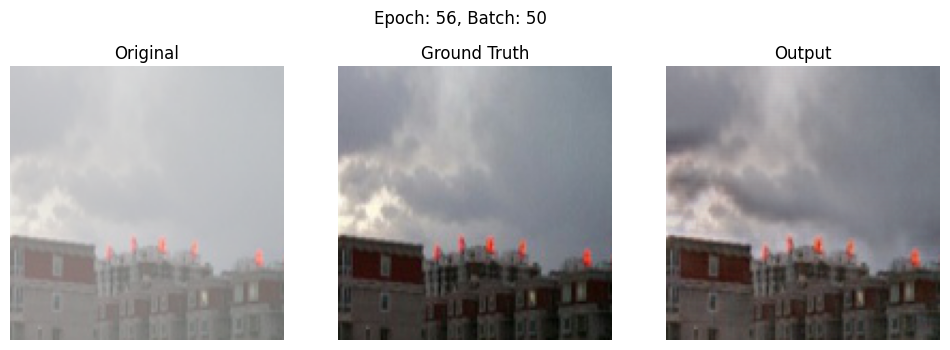

✅ Saved plot: ./plots/epoch_56_batch_100.png


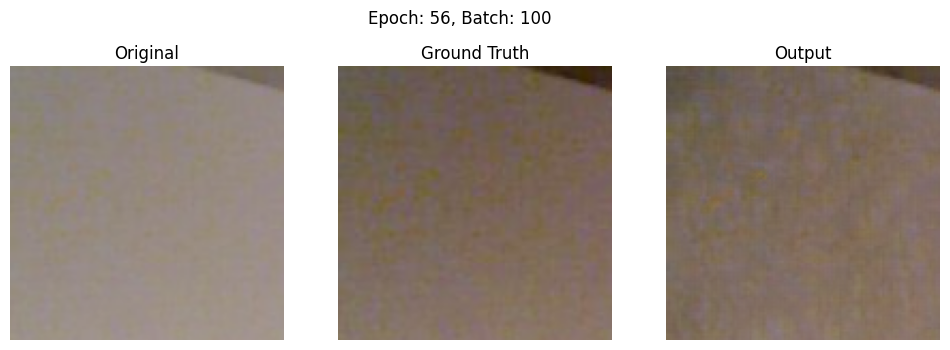

✅ Saved plot: ./plots/epoch_56_batch_150.png


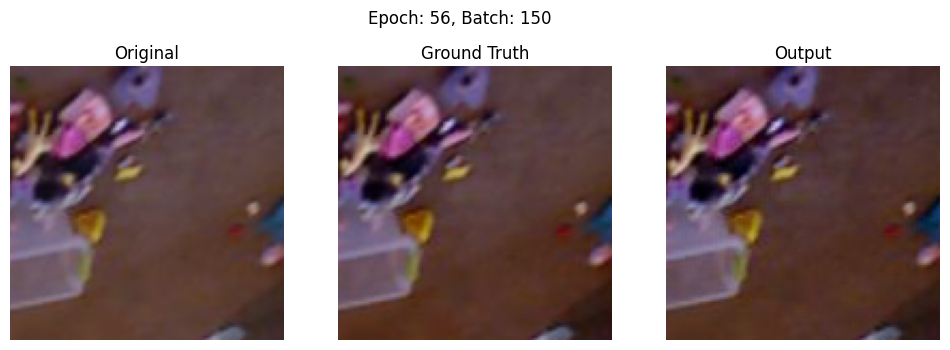

✅ Saved plot: ./plots/epoch_56_batch_200.png


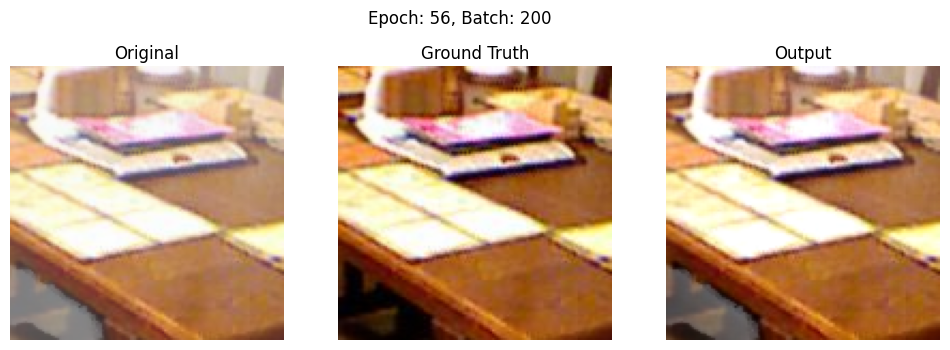

✅ Saved plot: ./plots/epoch_56_batch_250.png


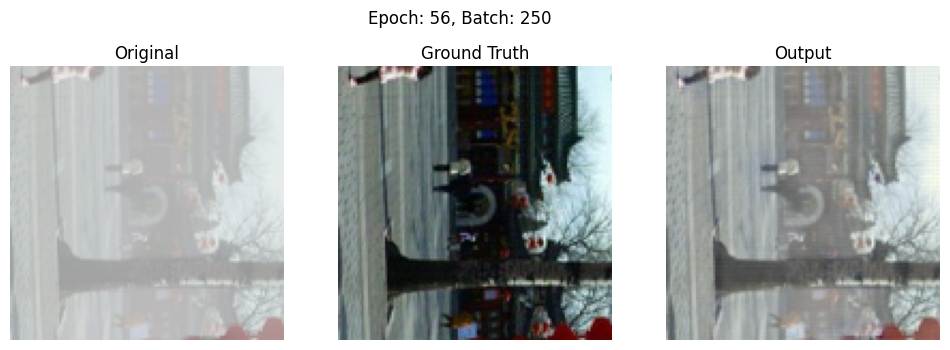

✅ Saved plot: ./plots/epoch_56_batch_300.png


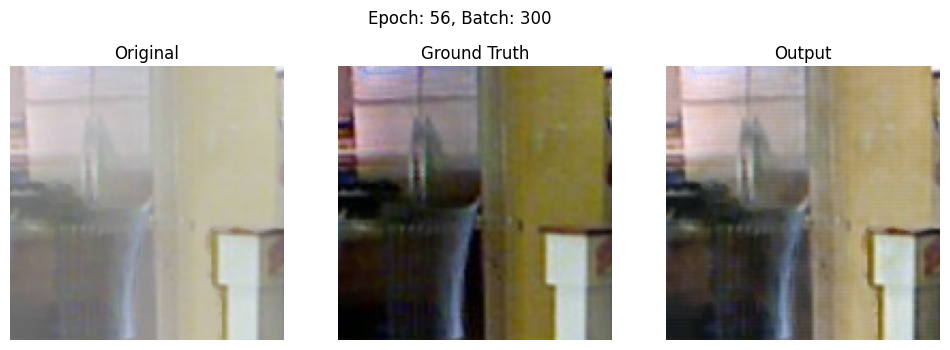

✅ Saved plot: ./plots/epoch_56_batch_350.png


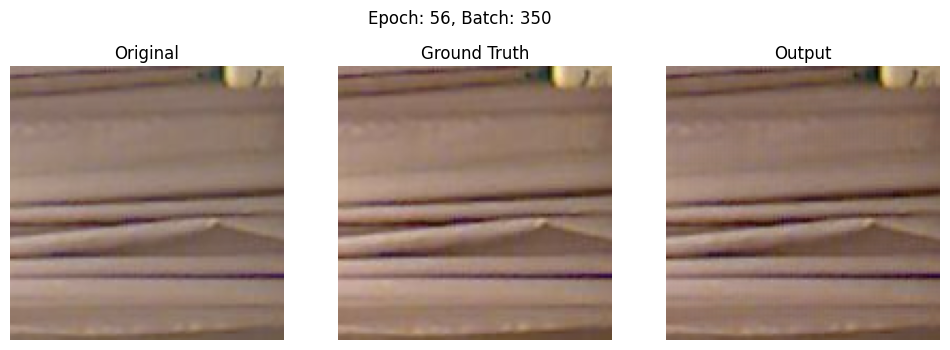

✅ Saved plot: ./plots/epoch_56_batch_400.png


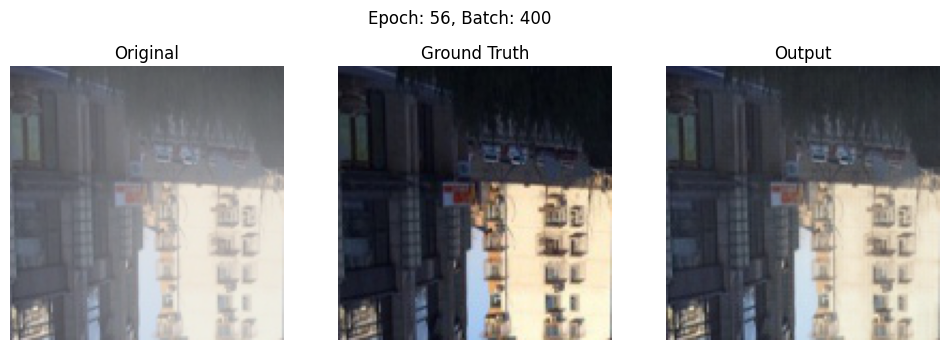

✅ Saved plot: ./plots/epoch_56_batch_450.png


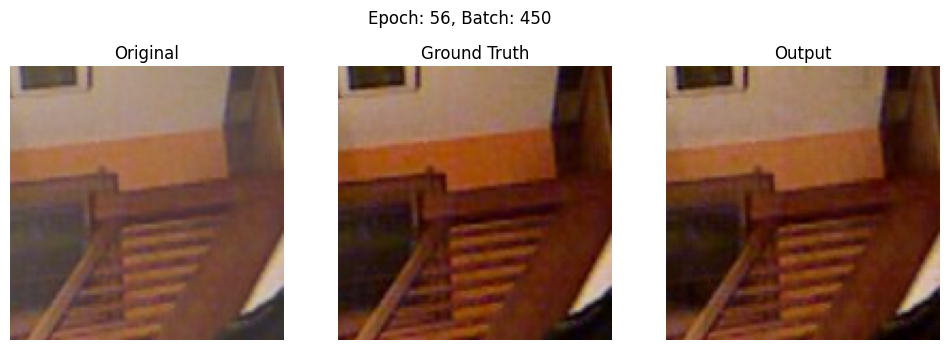

✅ Saved plot: ./plots/epoch_56_batch_500.png


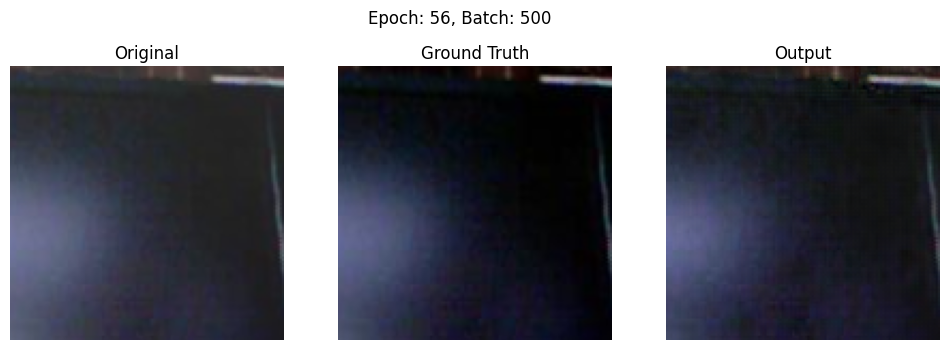

✅ Saved plot: ./plots/epoch_56_batch_550.png


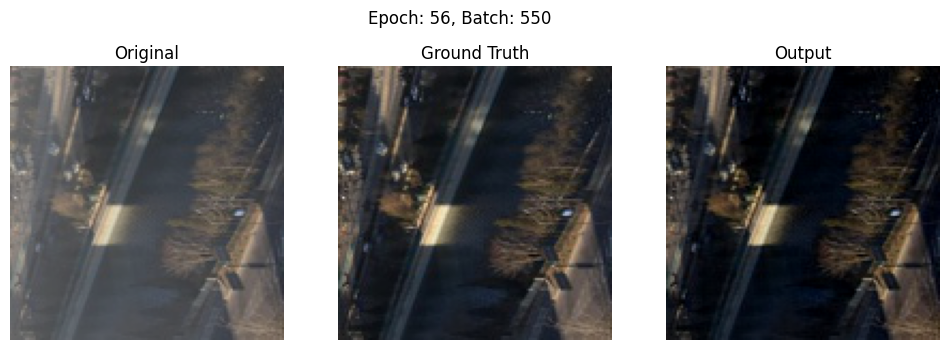

✅ Saved plot: ./plots/epoch_56_batch_600.png


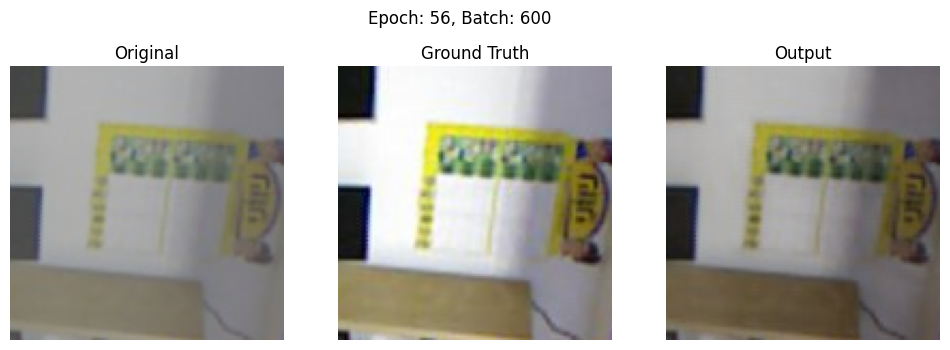

✅ Saved plot: ./plots/epoch_56_batch_650.png


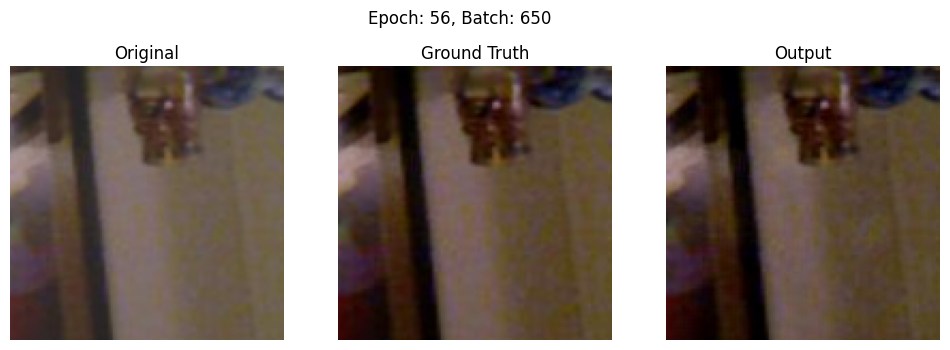

✅ Saved plot: ./plots/epoch_56_batch_700.png


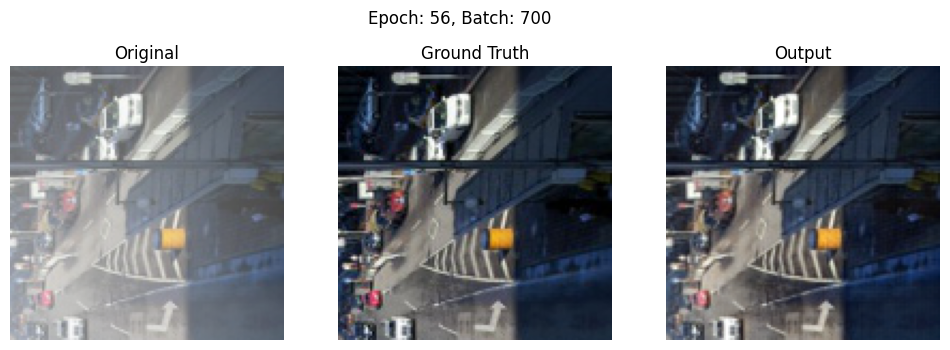

✅ Saved plot: ./plots/epoch_56_batch_750.png


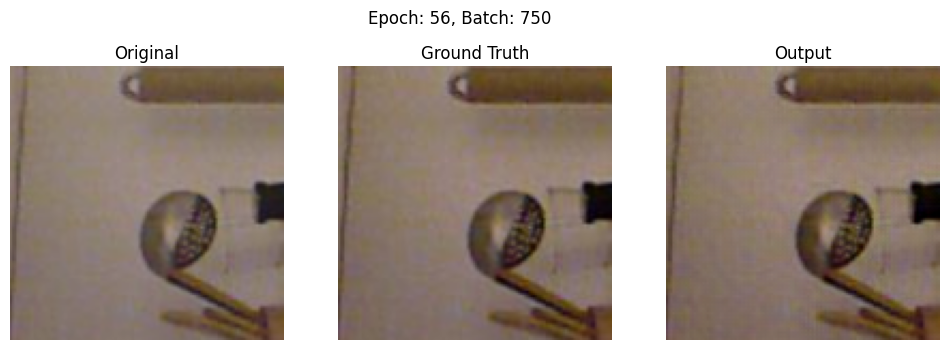

✅ Saved plot: ./plots/epoch_56_batch_800.png


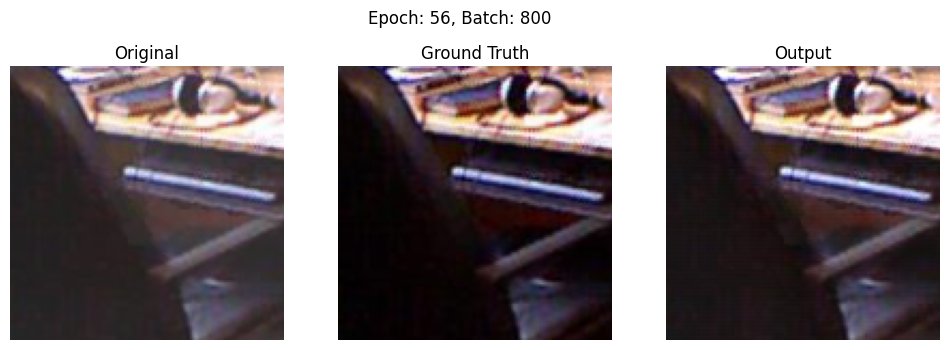

✅ Saved plot: ./plots/epoch_56_batch_850.png


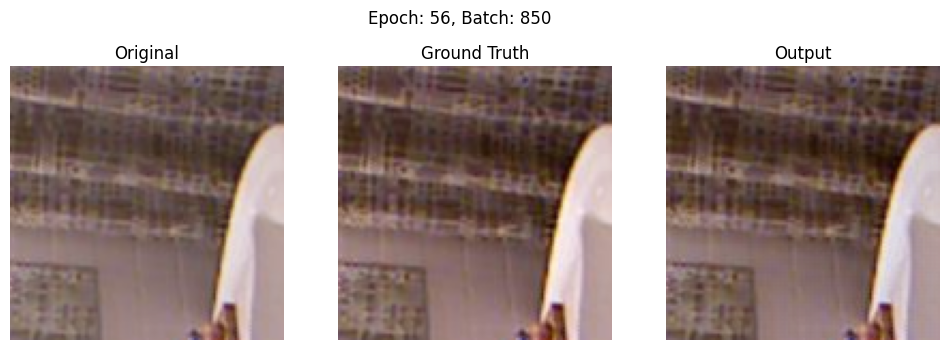

✅ Saved plot: ./plots/epoch_56_batch_900.png


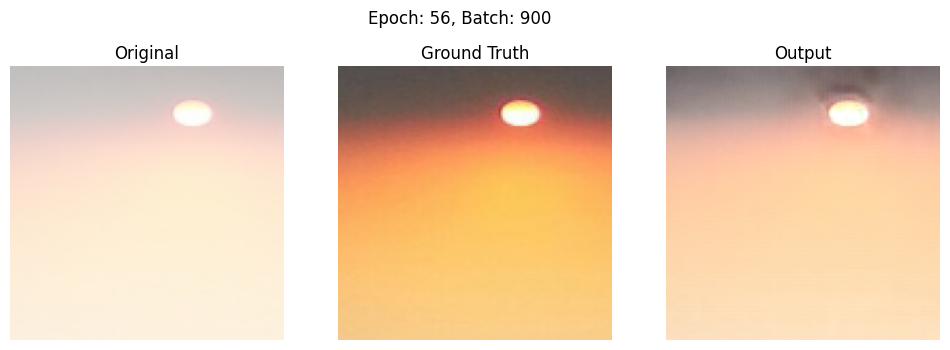

✅ Saved plot: ./plots/epoch_56_batch_950.png


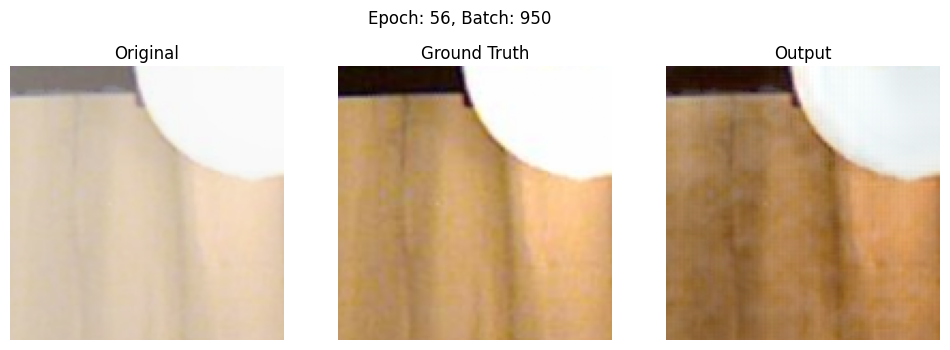

✅ Saved plot: ./plots/epoch_56_batch_1000.png


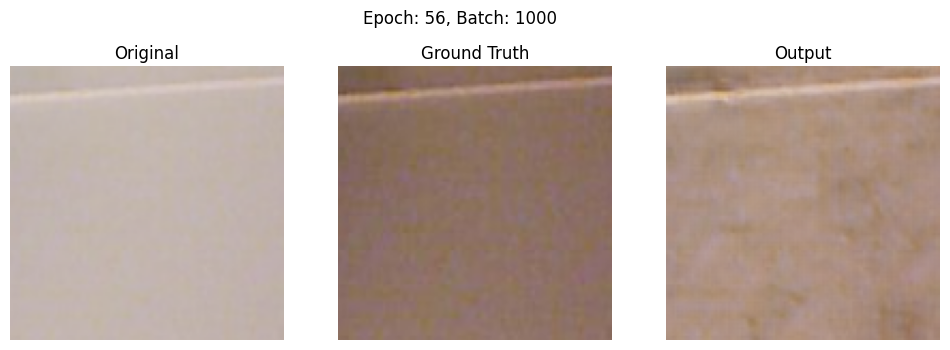

✅ Saved plot: ./plots/epoch_56_batch_1050.png


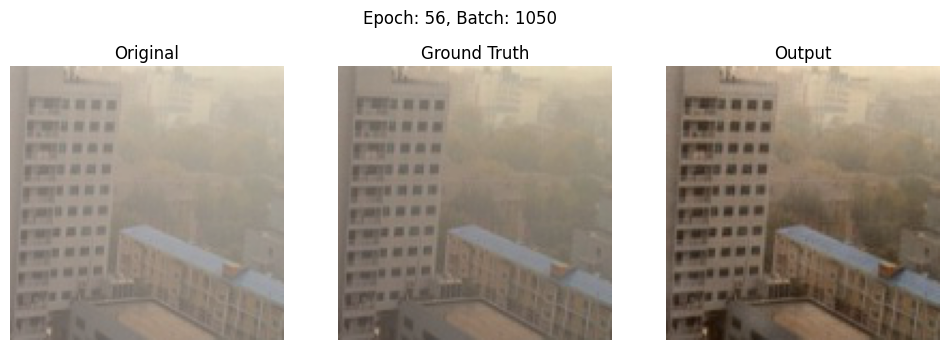

✅ Saved plot: ./plots/epoch_56_batch_1100.png


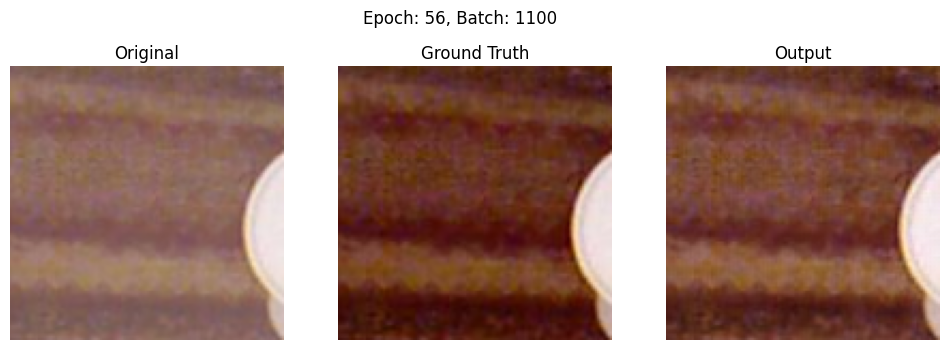

✅ Saved plot: ./plots/epoch_56_batch_1150.png


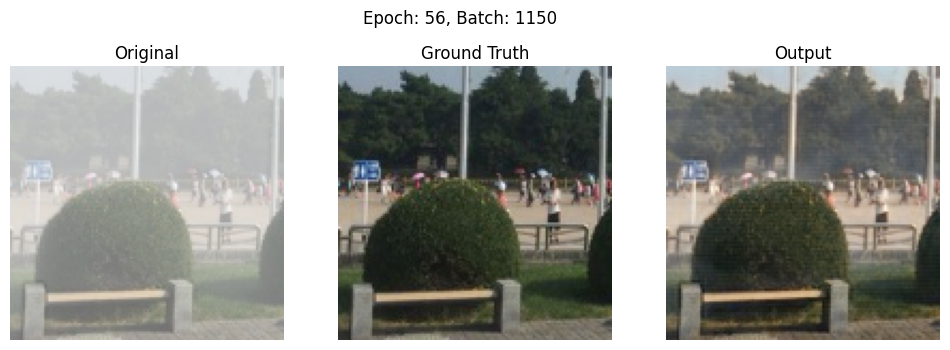

✅ Saved plot: ./plots/epoch_56_batch_1200.png


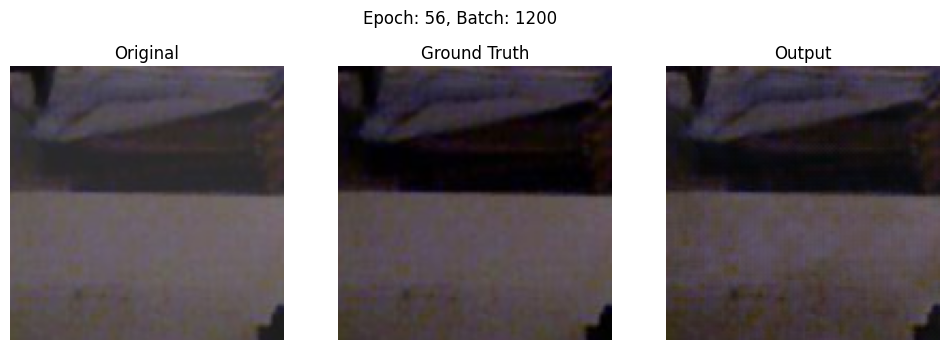

✅ Saved plot: ./plots/epoch_56_batch_1250.png


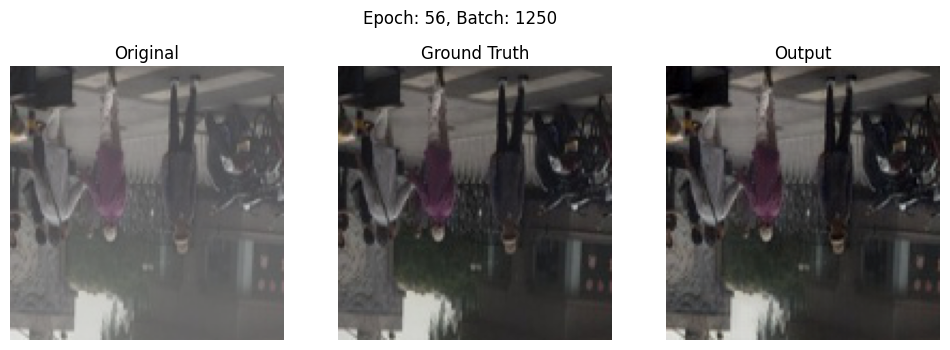

✅ Saved plot: ./plots/epoch_56_batch_1300.png


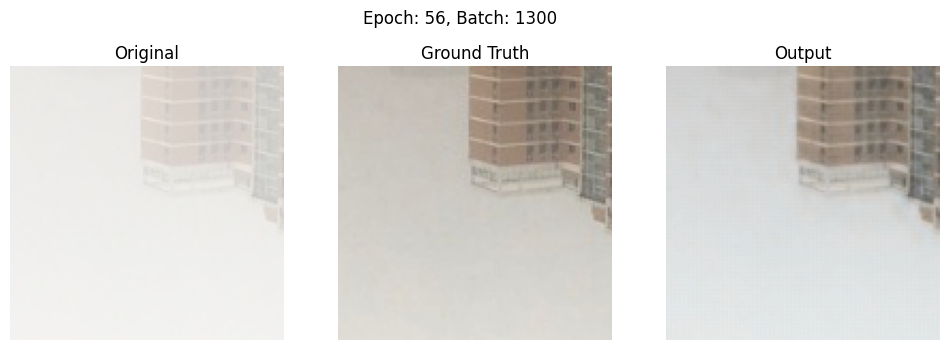

✅ Saved plot: ./plots/epoch_56_batch_1350.png


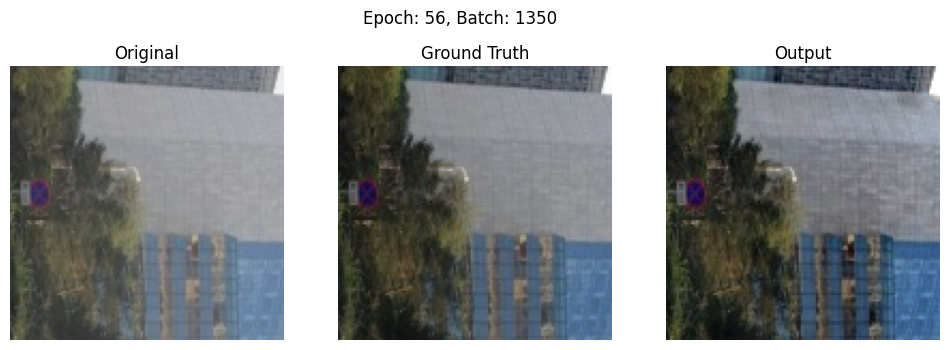

✅ Saved plot: ./plots/epoch_56_batch_1400.png


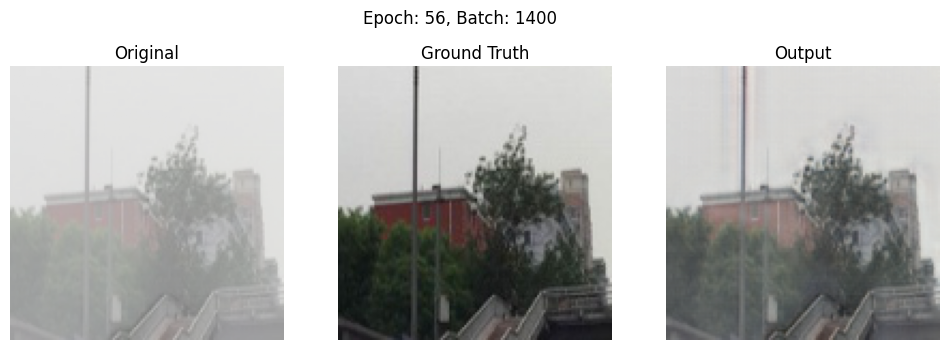

✅ Saved plot: ./plots/epoch_56_batch_1450.png


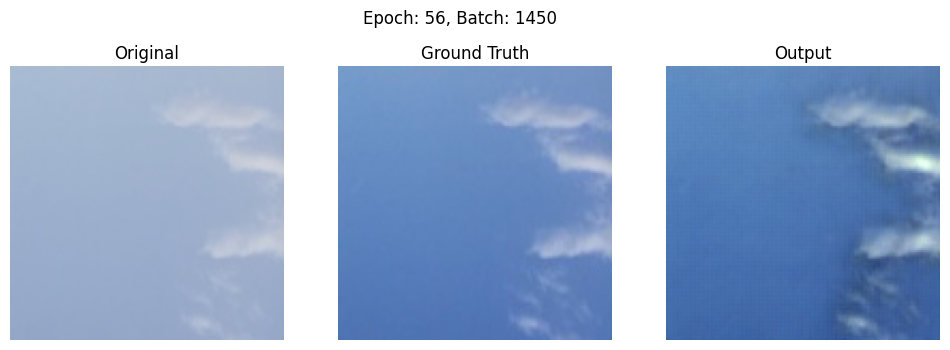

✅ Saved plot: ./plots/epoch_56_batch_1500.png


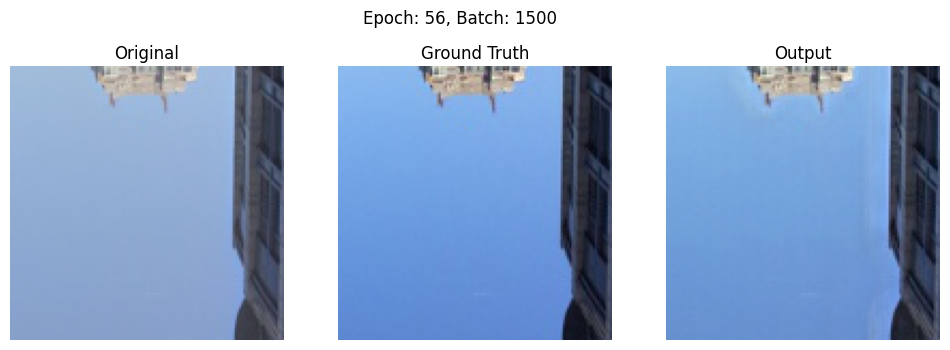

✅ Saved plot: ./plots/epoch_56_batch_1550.png


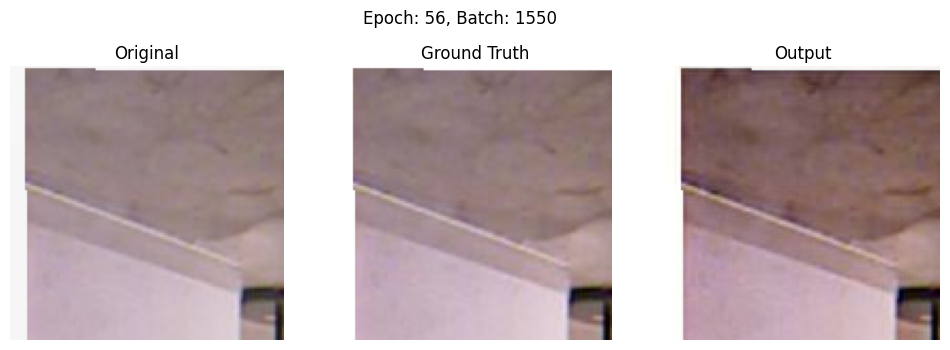

✅ Saved plot: ./plots/epoch_56_batch_1600.png


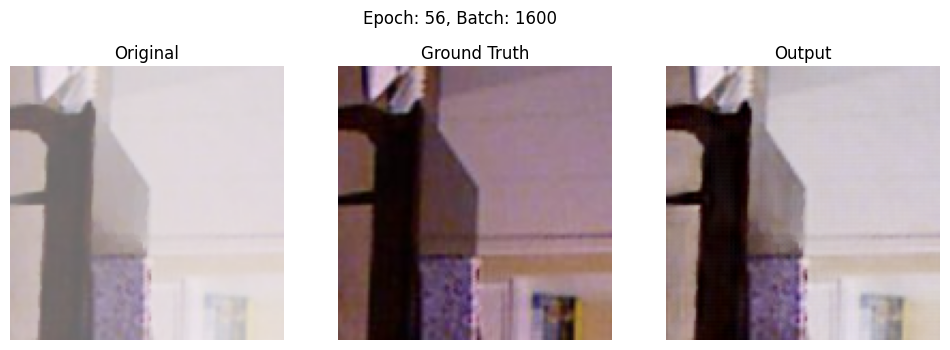

✅ Saved plot: ./plots/epoch_56_batch_1650.png


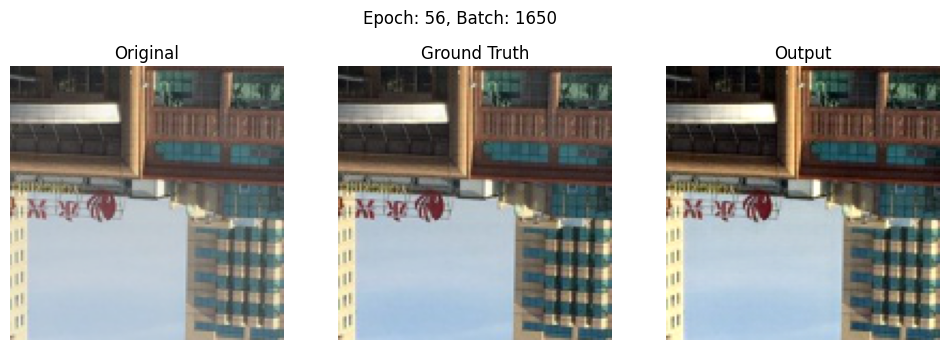

In [ ]:
#GPU Config
# Automatically use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

print("CUDA Available:", torch.cuda.is_available())
print("CUDA Device Count:", torch.cuda.device_count())
print("Current Device:", torch.cuda.current_device())
print("Device Name:", torch.cuda.get_device_name(0))
print("PyTorch CUDA version:", torch.version.cuda)

import os
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'max_split_size_mb:64'

torch.cuda.empty_cache()
torch.cuda.ipc_collect()



parser = argparse.ArgumentParser()
#parser.add_argument('--model', default='gunet_t', type=str, help='model name')
#parser.add_argument('--num_workers', default=16, type=int, help='number of workers')
#parser.add_argument('--use_mp', action='store_true', default=False, help='use Mixed Precision')
#parser.add_argument('--use_ddp', action='store_true', default=False, help='use Distributed Data Parallel')
#parser.add_argument('--save_dir', default='./saved_models/', type=str, help='path to models saving')
#parser.add_argument('--data_dir', default='./data/', type=str, help='path to dataset')   # Keep the base data path
#parser.add_argument('--data_dir', default='C:/Users/ritan/OneDrive/Desktop/Original_gUNET/gUNET/data/', type=str, help='path to dataset')
#parser.add_argument('--log_dir', default='./logs/', type=str, help='path to logs')

# Update dataset names to match your folder structure
#parser.add_argument('--train_set', default='/kaggle/input/haze4k-t', type=str, help='train dataset name')   # Train dataset
#parser.add_argument('--val_set', default='/kaggle/input/haze4k-v', type=str, help='valid dataset name')     # Validation dataset

# Experiment settings
#parser.add_argument('--exp', default='reside-in', type=str, help='experiment setting')

#args = parser.parse_args()


args = parser.parse_args(args=[])

args.model = 'gunet_t'
args.num_workers = 4
args.use_mp = False
args.use_ddp = False
args.save_dir = './saved_models/'
args.log_dir = './logs/'
args.train_set = '/kaggle/input/haze4k-t'  # training dataset path
args.val_set = '/kaggle/input/haze4k-v'    # validation dataset path
args.exp = 'reside-in'
args.data_dir = ''
args.load_dir= '/kaggle/input/gunet_t/pytorch/default/1/'




# training environment
if args.use_ddp:
	torch.distributed.init_process_group(backend='nccl', init_method='env://')
	world_size = dist.get_world_size()
	local_rank = dist.get_rank()
	torch.cuda.set_device(local_rank)
	if local_rank == 0: print('==> Using DDP.')
else:
	world_size = 1


# training config

b_setup = {
    "t_patch_size": 128,             # Reduced patch size to reduce VRAM usage
    "valid_mode": "valid",
    "v_patch_size": 256,             # Smaller validation patches
    "v_batch_ratio": 0.5,
    "edge_decay": 0.1,
    "weight_decay": 0.01,
    "data_augment": True,
    "cache_memory": False,
    "num_iter": 8192,                # Reduced iterations
    "epochs": 500,                   # Fewer epochs
    "warmup_epochs": 10,             # Fewer warmup epochs
    "const_epochs": 0,
    "frozen_epochs": 100,
    "eval_freq": 5                    # More frequent evaluation
}

variant = args.model.split('_')[-1]
config_name = 'model_'+variant+'.json' if variant in ['t', 's', 'b', 'd'] else 'default.json'	# default.json as baselines' configuration file 

m_setup = {
"batch_size": 2,
"lr": 8e-4
}


def reduce_mean(tensor, nprocs):
	rt = tensor.clone()
	dist.all_reduce(rt, op=dist.ReduceOp.SUM)
	rt /= nprocs
	return rt


def train(train_loader, network, criterion, optimizer, scaler, epochs, frozen_bn=False, plot_interval=50):
	losses = AverageMeter()

	torch.cuda.empty_cache()
	
	network.eval() if frozen_bn else network.train()	# simplified implementation that other modules may be affected
	

#	for batch in enumerate(train_loader):
#		source_img = batch['source'].cuda()
#		target_img = batch['target'].cuda()
	batch_count = 0  # ✅ Counter to track batch index
	for batch in train_loader:
		batch_count += 1  # ✅ Increment batch counter manually

		# ✅ Access images from dictionary
		source_img = batch['source'].to('cuda')
		target_img = batch['target'].to('cuda')
		output = network(source_img)


		with autocast(args.use_mp):
			output = network(source_img)
			loss = criterion(output, target_img)

		optimizer.zero_grad()
		scaler.scale(loss).backward()
		scaler.step(optimizer)
		scaler.update()

		if args.use_ddp: loss = reduce_mean(loss, dist.get_world_size())
		losses.update(loss.item())

#		# Show images during training
#		if batch % 10 == 0:
#			show_images(source_img, target_img, output, epochs, batch)

        # ✅ Automatically plot and save images every `plot_interval` batches
		if batch_count % plot_interval == 0:
			#print(f"\n🛠️ Plotting images at Epoch {epochs}, Batch {batch_count}...")
			show_images(source_img, target_img, output, epochs, batch_count)



	return losses.avg


def valid(val_loader, network):
	PSNR = AverageMeter()

	torch.cuda.empty_cache()

	network.eval()

	for batch in val_loader:
		source_img = batch['source'].to('cuda')
		target_img = batch['target'].to('cuda')

		with torch.no_grad():
			H, W = source_img.shape[2:]
			source_img = pad_img(source_img, network.module.patch_size if hasattr(network.module, 'patch_size') else 16)
			output = network(source_img).clamp_(-1, 1)
			output = output[:, :, :H, :W]

		mse_loss = F.mse_loss(output * 0.5 + 0.5, target_img * 0.5 + 0.5, reduction='none').mean((1, 2, 3))
		psnr = 10 * torch.log10(1 / mse_loss).mean()
		# if args.use_ddp: psnr = reduce_mean(psnr, dist.get_world_size())		# comment this line for more accurate validation
		
		PSNR.update(psnr.item(), source_img.size(0))

	return PSNR.avg


# Visualization Function


def show_images(orig, target, output, epoch, batch, save_dir="./plots", display_time=3):
    """ 
    Visualize and save original, target, and output images side by side.
    Automatically close and save the images.
    """
    os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist

    plt.ion()  # ✅ Enable interactive mode
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Convert tensors to NumPy and transpose for display
    orig = orig.detach().cpu().numpy().transpose(0, 2, 3, 1)[0]
    target = target.detach().cpu().numpy().transpose(0, 2, 3, 1)[0]
    output = output.detach().cpu().numpy().transpose(0, 2, 3, 1)[0]

    # Normalize and clip the values to [0,1] range
    orig = (orig * 0.5 + 0.5).clip(0, 1)
    target = (target * 0.5 + 0.5).clip(0, 1)
    output = (output * 0.5 + 0.5).clip(0, 1)

    # Display images
    axes[0].imshow(orig)
    axes[0].set_title('Original')
    axes[0].axis('off')

    axes[1].imshow(target)
    axes[1].set_title('Ground Truth')
    axes[1].axis('off')

    axes[2].imshow(output)
    axes[2].set_title('Output')
    axes[2].axis('off')

    plt.suptitle(f'Epoch: {epoch}, Batch: {batch}')

    # ✅ Save the image
    plot_path = os.path.join(save_dir, f"epoch_{epoch}_batch_{batch}.png")
    plt.savefig(plot_path)
    print(f"✅ Saved plot: {plot_path}")

    # ✅ Display for `display_time` seconds, then close automatically
    plt.pause(display_time)
    plt.close(fig)  # ✅ Automatically close the plot
    plt.ioff()  # Disable interactive mode




def main():
	# define network, and use DDP for faster training
	network = eval(args.model)()
	network.to('cuda')

	if args.use_ddp:
		network = DistributedDataParallel(network, device_ids=[local_rank], output_device=local_rank)
		if m_setup['batch_size'] // world_size < 16:
			if local_rank == 0: print('==> Using SyncBN because of too small norm-batch-size.')
			nn.SyncBatchNorm.convert_sync_batchnorm(network)
	else:
		network = DataParallel(network)
		if m_setup['batch_size'] // torch.cuda.device_count() < 16:
			print('==> Using SyncBN because of too small norm-batch-size.')
			convert_model(network)

	# define loss function
	criterion = nn.L1Loss()
	
	# define optimizer
	optimizer = torch.optim.AdamW(network.parameters(), lr=m_setup['lr'], weight_decay=b_setup['weight_decay'])
	lr_scheduler = CosineScheduler(optimizer, param_name='lr', t_max=b_setup['epochs'], value_min=m_setup['lr'] * 1e-2, 
								   warmup_t=b_setup['warmup_epochs'], const_t=b_setup['const_epochs'])
	wd_scheduler = CosineScheduler(optimizer, param_name='weight_decay', t_max=b_setup['epochs'])	# seems not to work
	scaler = GradScaler()

	# load saved model
	save_dir = os.path.join(args.save_dir)
    #load_dir = os.path.join(args.load_dir)
	os.makedirs(args.load_dir, exist_ok=True)
	if not os.path.exists(os.path.join(args.load_dir, args.model+'.pth')):
		best_psnr = 0
		cur_epoch = 0
	else:
		if not args.use_ddp or local_rank == 0: print('==> Loaded existing trained model.')
		model_info = torch.load(os.path.join(args.load_dir, args.model+'.pth'), map_location='cpu')
		network.load_state_dict(model_info['state_dict'])
		optimizer.load_state_dict(model_info['optimizer'])
		lr_scheduler.load_state_dict(model_info['lr_scheduler'])
		wd_scheduler.load_state_dict(model_info['wd_scheduler'])
		scaler.load_state_dict(model_info['scaler'])
		cur_epoch = model_info['cur_epoch']
		best_psnr = model_info['best_psnr']

	# define dataset
	train_dataset = PairLoader(os.path.join(args.data_dir, args.train_set), 'train', 
							   b_setup['t_patch_size'], 
							   b_setup['edge_decay'], 
							   b_setup['data_augment'], 
							   b_setup['cache_memory'])
	train_loader = DataLoader(train_dataset,
							  batch_size = 2,  #batch_size=m_setup['batch_size'] // world_size,
							  sampler=RandomSampler(train_dataset, num_samples=b_setup['num_iter'] // world_size),
							  num_workers = 4, #num_workers=args.num_workers // world_size,
							  pin_memory=True,
							  drop_last=True,
							  persistent_workers=True)	# comment this line for cache_memory

	val_dataset = PairLoader(os.path.join(args.data_dir, args.val_set), b_setup['valid_mode'], 
							 b_setup['v_patch_size'])
	val_loader = DataLoader(val_dataset,
							batch_size=max(int(m_setup['batch_size'] * b_setup['v_batch_ratio'] // world_size), 1),
							# sampler=DistributedSampler(val_dataset, shuffle=False),		# comment this line for more accurate validation
							num_workers=args.num_workers // world_size,
							pin_memory=True)

	# start training
	if not args.use_ddp or local_rank == 0:
		print('==> Start training, current model name: ' + args.model)
		writer = SummaryWriter(log_dir=os.path.join(args.log_dir, args.exp, args.model))

	for epoch in tqdm(range(cur_epoch, b_setup['epochs'] + 1)):
		frozen_bn = epoch > (b_setup['epochs'] - b_setup['frozen_epochs']) 
		
		loss = train(train_loader, network, criterion, optimizer, scaler, epoch, frozen_bn)
		lr_scheduler.step(epoch + 1)
		wd_scheduler.step(epoch + 1)

		if not args.use_ddp or local_rank == 0:
			writer.add_scalar('train_loss', loss, epoch)

		if epoch % b_setup['eval_freq'] == 0:
			avg_psnr = valid(val_loader, network)
			
			if not args.use_ddp or local_rank == 0:
				if avg_psnr > best_psnr:
					best_psnr = avg_psnr
					torch.save({'cur_epoch': epoch + 1,
								'best_psnr': best_psnr,
								'state_dict': network.state_dict(),
								'optimizer' : optimizer.state_dict(),
								'lr_scheduler' : lr_scheduler.state_dict(),
								'wd_scheduler' : wd_scheduler.state_dict(),
								'scaler' : scaler.state_dict()},
								os.path.join(save_dir, args.model+'.pth'))
				
				writer.add_scalar('valid_psnr', avg_psnr, epoch)
				writer.add_scalar('best_psnr', best_psnr, epoch)
		
			if args.use_ddp: dist.barrier()
		

if __name__ == '__main__':
	main()